In [1]:
import os
import glob
import h5py
import json
import matplotlib.pyplot as plt
import numpy as np
import datetime

# 250427 testing and messing around

In [49]:
file_path = r"/Volumes/MBQD_data/AION/Data/2024/08/12/ramping_duration/centraldpaomfrequency_349300000.0_bluemottime_2.0_tofafterbbmod_0.0_ad9910rampingduration_0.1_redmotbeam_on_rampwidth_5000000.0_mirnyfrequency_460000000.0_redmotBfield_10.0_tranbiasfield_3.5_08-12_19-10-32.h5"
# Open the HDF5 file to extract the relevant datasets
with h5py.File(file_path, 'r') as h5file:
    camera3DH = h5file['camera3DH'][:]
    experimental_parameters = h5file['experimental_parameters'][:]

In [50]:
np.shape(camera3DH)

(2, 1200, 1200)

In [51]:
camera3DH[0]

array([[  8.,  32.,   4., ...,  24.,  68.,  44.],
       [ 12.,   4.,  16., ...,  60.,  76.,  56.],
       [  4.,  16.,  36., ...,  60., 100.,  60.],
       ...,
       [128.,  88.,  64., ..., 116.,  56.,  40.],
       [ 36.,  40.,  52., ...,  88.,  40.,  64.],
       [ 36.,  56.,  40., ...,  68.,  56.,  84.]])

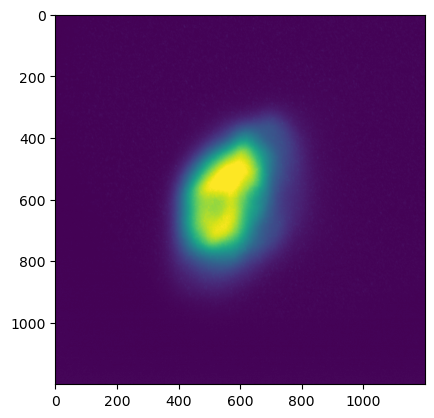

In [52]:
plt.imshow(camera3DH[0])

In [53]:
camera3DH[1]

array([[ 12.,   4.,  20., ...,   8.,  36.,  20.],
       [  8.,   4.,  12., ...,  36.,  32.,  32.],
       [ 16.,  24.,  12., ...,  36.,  32.,  32.],
       ...,
       [124.,  72.,  68., ...,  92.,  48.,  48.],
       [ 56.,  40.,  60., ...,  92.,  68.,  88.],
       [ 40.,  64.,  32., ...,  80.,  72.,  96.]])

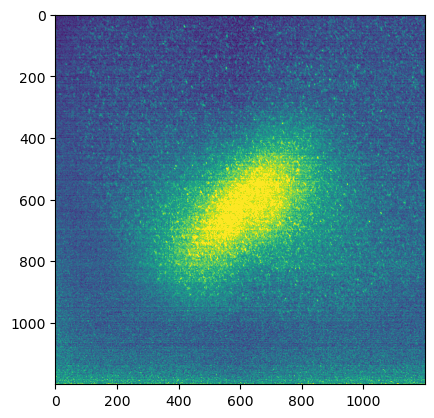

In [54]:
plt.imshow(camera3DH[1],vmin=0, vmax=100)

(2, 1200, 1200)


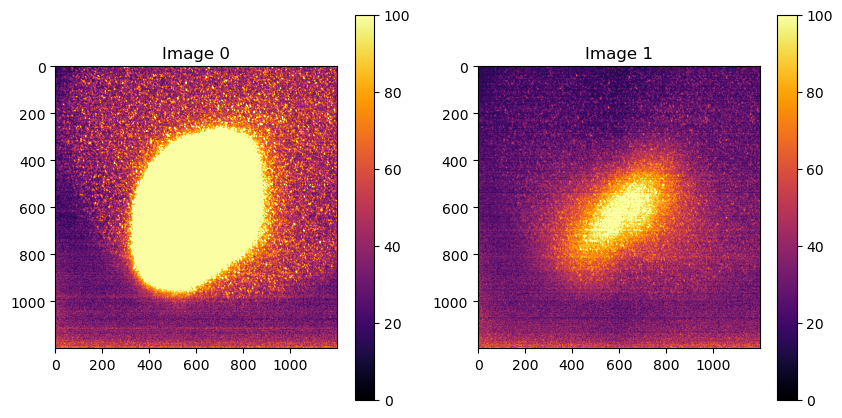

In [56]:
import h5py
import matplotlib.pyplot as plt

# Open the HDF5 file
with h5py.File(r"/Volumes/MBQD_data/AION/Data/2024/08/12/ramping_duration/centraldpaomfrequency_349300000.0_bluemottime_2.0_tofafterbbmod_0.0_ad9910rampingduration_0.1_redmotbeam_on_rampwidth_5000000.0_mirnyfrequency_460000000.0_redmotBfield_10.0_tranbiasfield_3.5_08-12_19-10-32.h5", 'r') as f:
    data = f['camera3DH'][:]  # Replace with the actual dataset path

print(data.shape)  # Should print (2, 1200, 1200)

# Visualize both images
plt.figure(figsize=(10, 5))

for i in range(data.shape[0]):
    plt.subplot(1, 2, i+1)
    plt.imshow(data[i], cmap='inferno', vmin=0, vmax=100)
    plt.title(f'Image {i}')
    plt.colorbar()

plt.show()


In [21]:
file_path = r"/Volumes/MBQD_data/AION/Data/2024/08/12/ramping_duration/centraldpaomfrequency_349300000.0_bluemottime_2.0_tofafterbbmod_0.0_ad9910rampingduration_0.1_redmotbeam_on_rampwidth_5000000.0_mirnyfrequency_460000000.0_redmotBfield_10.0_tranbiasfield_3.5_08-12_19-10-32.h5"
# Open the HDF5 file to extract the relevant datasets
with h5py.File(file_path, 'r') as h5file:
    camera3DH = h5file['camera3DH'][:]
    experimental_parameters = h5file['experimental_parameters'][:]
    term_name = f"redMOT_{int(experimental_parameters[3]*1000)}ms"
    term_value = camera3DH[1]
    my_dict[term_name] = term_value

In [25]:
file_path = r"/Volumes/MBQD_data/AION/Data/2024/08/12/ramping_duration/centraldpaomfrequency_349300000.0_bluemottime_2.0_tofafterbbmod_0.0_ad9910rampingduration_0.1_redmotbeam_on_rampwidth_5000000.0_mirnyfrequency_460000000.0_redmotBfield_10.0_tranbiasfield_3.5_08-12_19-10-32.h5"

add_redMOT_to_dict(file_path)
# Print the dictionary to see the result
print(my_dict)

{'redMOT_100ms': array([[ 12.,   4.,  20., ...,   8.,  36.,  20.],
       [  8.,   4.,  12., ...,  36.,  32.,  32.],
       [ 16.,  24.,  12., ...,  36.,  32.,  32.],
       ...,
       [124.,  72.,  68., ...,  92.,  48.,  48.],
       [ 56.,  40.,  60., ...,  92.,  68.,  88.],
       [ 40.,  64.,  32., ...,  80.,  72.,  96.]])}


In [22]:
my_dict

{'redMOT_100ms': array([[ 12.,   4.,  20., ...,   8.,  36.,  20.],
        [  8.,   4.,  12., ...,  36.,  32.,  32.],
        [ 16.,  24.,  12., ...,  36.,  32.,  32.],
        ...,
        [124.,  72.,  68., ...,  92.,  48.,  48.],
        [ 56.,  40.,  60., ...,  92.,  68.,  88.],
        [ 40.,  64.,  32., ...,  80.,  72.,  96.]])}

In [18]:
int(experimental_parameters[3]*1000)

100

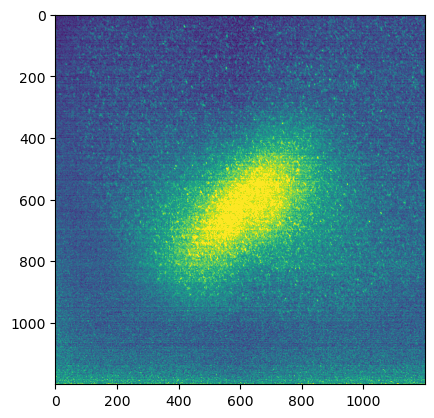

In [14]:
plt.imshow(camera3DH[1],vmin=0, vmax=100)

In [ ]:
experimental_parameters

In [65]:
int(experimental_parameters[3]*1000)

100

In [66]:
int(0.70000000001 * 1000)

700

# 250427 Plotting Fluorescence Images

In [2]:
redMOT_dict = {}   # reinitialize the dictionary

def add_redMOT_to_dict(file_path):
    # Open the HDF5 file to extract the relevant datasets
    with h5py.File(file_path, 'r') as h5file:
        camera3DH = h5file['camera3DH'][:]
        experimental_parameters = h5file['experimental_parameters'][:]
        term_name = f"{int(experimental_parameters[3]*1000)} ms"
        term_value = camera3DH[1]
        redMOT_dict[term_name] = term_value

blueMOT_dict = {}

def add_blueMOT_to_dict(file_path):
    # Open the HDF5 file to extract the relevant datasets
    with h5py.File(file_path, 'r') as h5file:
        camera3DH = h5file['camera3DH'][:]
        experimental_parameters = h5file['experimental_parameters'][:]
        term_name = f"{int(experimental_parameters[3]*1000)} ms"
        term_value = camera3DH[0]
        blueMOT_dict[term_name] = term_value

In [3]:
file_paths = [r"/Volumes/MBQD_data/AION/Data/2024/08/12/ramping_duration/centraldpaomfrequency_349300000.0_bluemottime_2.0_tofafterbbmod_0.0_ad9910rampingduration_0.01_redmotbeam_on_rampwidth_5000000.0_mirnyfrequency_460000000.0_redmotBfield_10.0_tranbiasfield_3.5_08-12_18-59-16.h5",
              r"/Volumes/MBQD_data/AION/Data/2024/08/12/ramping_duration/centraldpaomfrequency_349300000.0_bluemottime_2.0_tofafterbbmod_0.0_ad9910rampingduration_0.02_redmotbeam_on_rampwidth_5000000.0_mirnyfrequency_460000000.0_redmotBfield_10.0_tranbiasfield_3.5_08-12_18-57-19.h5",
              r"/Volumes/MBQD_data/AION/Data/2024/08/12/ramping_duration/centraldpaomfrequency_349300000.0_bluemottime_2.0_tofafterbbmod_0.0_ad9910rampingduration_0.03_redmotbeam_on_rampwidth_5000000.0_mirnyfrequency_460000000.0_redmotBfield_10.0_tranbiasfield_3.5_08-12_18-56-00.h5",
              r"/Volumes/MBQD_data/AION/Data/2024/08/12/ramping_duration/centraldpaomfrequency_349300000.0_bluemottime_2.0_tofafterbbmod_0.0_ad9910rampingduration_0.04_redmotbeam_on_rampwidth_5000000.0_mirnyfrequency_460000000.0_redmotBfield_10.0_tranbiasfield_3.5_08-12_18-54-22.h5",
              r"/Volumes/MBQD_data/AION/Data/2024/08/12/ramping_duration/centraldpaomfrequency_349300000.0_bluemottime_2.0_tofafterbbmod_0.0_ad9910rampingduration_0.05_redmotbeam_on_rampwidth_5000000.0_mirnyfrequency_460000000.0_redmotBfield_10.0_tranbiasfield_3.5_08-12_18-50-36.h5",
              r"/Volumes/MBQD_data/AION/Data/2024/08/12/ramping_duration/centraldpaomfrequency_349300000.0_bluemottime_2.0_tofafterbbmod_0.0_ad9910rampingduration_0.06_redmotbeam_on_rampwidth_5000000.0_mirnyfrequency_460000000.0_redmotBfield_10.0_tranbiasfield_3.5_08-12_19-04-57.h5",
              r"/Volumes/MBQD_data/AION/Data/2024/08/12/ramping_duration/centraldpaomfrequency_349300000.0_bluemottime_2.0_tofafterbbmod_0.0_ad9910rampingduration_0.07_redmotbeam_on_rampwidth_5000000.0_mirnyfrequency_460000000.0_redmotBfield_10.0_tranbiasfield_3.5_08-12_19-06-00.h5",
              r"/Volumes/MBQD_data/AION/Data/2024/08/12/ramping_duration/centraldpaomfrequency_349300000.0_bluemottime_2.0_tofafterbbmod_0.0_ad9910rampingduration_0.08_redmotbeam_on_rampwidth_5000000.0_mirnyfrequency_460000000.0_redmotBfield_10.0_tranbiasfield_3.5_08-12_19-07-02.h5",
              r"/Volumes/MBQD_data/AION/Data/2024/08/12/ramping_duration/centraldpaomfrequency_349300000.0_bluemottime_2.0_tofafterbbmod_0.0_ad9910rampingduration_0.09_redmotbeam_on_rampwidth_5000000.0_mirnyfrequency_460000000.0_redmotBfield_10.0_tranbiasfield_3.5_08-12_19-09-39.h5",
              r"/Volumes/MBQD_data/AION/Data/2024/08/12/ramping_duration/centraldpaomfrequency_349300000.0_bluemottime_2.0_tofafterbbmod_0.0_ad9910rampingduration_0.1_redmotbeam_on_rampwidth_5000000.0_mirnyfrequency_460000000.0_redmotBfield_10.0_tranbiasfield_3.5_08-12_19-10-32.h5",
              r"/Volumes/MBQD_data/AION/Data/2024/08/12/ramping_duration/centraldpaomfrequency_349300000.0_bluemottime_2.0_tofafterbbmod_0.0_ad9910rampingduration_0.11_redmotbeam_on_rampwidth_5000000.0_mirnyfrequency_460000000.0_redmotBfield_10.0_tranbiasfield_3.5_08-12_19-11-31.h5",
              r"/Volumes/MBQD_data/AION/Data/2024/08/12/ramping_duration/centraldpaomfrequency_349300000.0_bluemottime_2.0_tofafterbbmod_0.0_ad9910rampingduration_0.12_redmotbeam_on_rampwidth_5000000.0_mirnyfrequency_460000000.0_redmotBfield_10.0_tranbiasfield_3.5_08-12_19-12-53.h5",
              r"/Volumes/MBQD_data/AION/Data/2024/08/12/ramping_duration/centraldpaomfrequency_349300000.0_bluemottime_2.0_tofafterbbmod_0.0_ad9910rampingduration_0.13_redmotbeam_on_rampwidth_5000000.0_mirnyfrequency_460000000.0_redmotBfield_10.0_tranbiasfield_3.5_08-12_19-13-49.h5",
              r"/Volumes/MBQD_data/AION/Data/2024/08/12/ramping_duration/centraldpaomfrequency_349300000.0_bluemottime_2.0_tofafterbbmod_0.0_ad9910rampingduration_0.18_redmotbeam_on_rampwidth_5000000.0_mirnyfrequency_460000000.0_redmotBfield_10.0_tranbiasfield_3.5_08-12_19-14-54.h5",
              r"/Volumes/MBQD_data/AION/Data/2024/08/12/ramping_duration/centraldpaomfrequency_349300000.0_bluemottime_2.0_tofafterbbmod_0.0_ad9910rampingduration_0.25_redmotbeam_on_rampwidth_5000000.0_mirnyfrequency_460000000.0_redmotBfield_10.0_tranbiasfield_3.5_08-12_19-15-28.h5",
              r"/Volumes/MBQD_data/AION/Data/2024/08/12/ramping_duration/centraldpaomfrequency_349300000.0_bluemottime_2.0_tofafterbbmod_0.0_ad9910rampingduration_0.3_redmotbeam_on_rampwidth_5000000.0_mirnyfrequency_460000000.0_redmotBfield_10.0_tranbiasfield_3.5_08-12_19-16-52.h5",
              r"/Volumes/MBQD_data/AION/Data/2024/08/12/ramping_duration/centraldpaomfrequency_349300000.0_bluemottime_2.0_tofafterbbmod_0.0_ad9910rampingduration_0.4_redmotbeam_on_rampwidth_5000000.0_mirnyfrequency_460000000.0_redmotBfield_10.0_tranbiasfield_3.5_08-12_19-18-29.h5",
              r"/Volumes/MBQD_data/AION/Data/2024/08/12/ramping_duration/centraldpaomfrequency_349300000.0_bluemottime_2.0_tofafterbbmod_0.0_ad9910rampingduration_0.5_redmotbeam_on_rampwidth_5000000.0_mirnyfrequency_460000000.0_redmotBfield_10.0_tranbiasfield_3.5_08-12_19-19-17.h5",
              r"/Volumes/MBQD_data/AION/Data/2024/08/12/ramping_duration/centraldpaomfrequency_349300000.0_bluemottime_2.0_tofafterbbmod_0.0_ad9910rampingduration_0.6_redmotbeam_on_rampwidth_5000000.0_mirnyfrequency_460000000.0_redmotBfield_10.0_tranbiasfield_3.5_08-12_19-21-51.h5",
              r"/Volumes/MBQD_data/AION/Data/2024/08/12/ramping_duration/centraldpaomfrequency_349300000.0_bluemottime_2.0_tofafterbbmod_0.0_ad9910rampingduration_0.7000000000000001_redmotbeam_on_rampwidth_5000000.0_mirnyfrequency_460000000.0_redmotBfield_10.0_tranbiasfield_3.5_08-12_19-22-35.h5",
              r"/Volumes/MBQD_data/AION/Data/2024/08/12/ramping_duration/centraldpaomfrequency_349300000.0_bluemottime_2.0_tofafterbbmod_0.0_ad9910rampingduration_0.8_redmotbeam_on_rampwidth_5000000.0_mirnyfrequency_460000000.0_redmotBfield_10.0_tranbiasfield_3.5_08-12_19-23-27.h5",
              r"/Volumes/MBQD_data/AION/Data/2024/08/12/ramping_duration/centraldpaomfrequency_349300000.0_bluemottime_2.0_tofafterbbmod_0.0_ad9910rampingduration_0.9_redmotbeam_on_rampwidth_5000000.0_mirnyfrequency_460000000.0_redmotBfield_10.0_tranbiasfield_3.5_08-12_19-24-42.h5",
              r"/Volumes/MBQD_data/AION/Data/2024/08/12/ramping_duration/centraldpaomfrequency_349300000.0_bluemottime_2.0_tofafterbbmod_0.0_ad9910rampingduration_1.0_redmotbeam_on_rampwidth_5000000.0_mirnyfrequency_460000000.0_redmotBfield_10.0_tranbiasfield_3.5_08-12_19-25-47.h5",
              r"/Volumes/MBQD_data/AION/Data/2024/08/12/ramping_duration/centraldpaomfrequency_349300000.0_bluemottime_2.0_tofafterbbmod_0.0_ad9910rampingduration_2.0_redmotbeam_on_rampwidth_5000000.0_mirnyfrequency_460000000.0_redmotBfield_10.0_tranbiasfield_3.5_08-12_19-26-27.h5",
              r"/Volumes/MBQD_data/AION/Data/2024/08/12/ramping_duration/centraldpaomfrequency_349300000.0_bluemottime_2.0_tofafterbbmod_0.0_ad9910rampingduration_3.0_redmotbeam_on_rampwidth_5000000.0_mirnyfrequency_460000000.0_redmotBfield_10.0_tranbiasfield_3.5_08-12_19-27-52.h5"]

In [4]:
for file_path in file_paths:
    add_redMOT_to_dict(file_path)
    add_blueMOT_to_dict(file_path)
# Now my_dict contains the redMOT images from all the files
# Print out the whole dictionary
print(redMOT_dict)

{'10 ms': array([[ 20.,   8.,  20., ...,   4.,  36.,  32.],
       [  8.,   4.,   4., ...,   8.,  16.,  36.],
       [  8.,  16.,  24., ...,  36.,  40.,  28.],
       ...,
       [132.,  96.,  80., ..., 124.,  64.,  52.],
       [ 32.,  56.,  48., ...,  72.,  52.,  92.],
       [ 32.,  72.,  32., ...,  60.,  56.,  92.]]), '20 ms': array([[ 20.,   4.,   4., ...,   0.,  32.,  32.],
       [  8.,   8.,  12., ...,  28.,  40.,  32.],
       [ 20.,  12.,  20., ...,  28.,  32.,  40.],
       ...,
       [120., 100.,  60., ..., 104.,  76.,  52.],
       [ 48.,  44.,  52., ...,  84.,  52.,  76.],
       [ 44.,  68.,  52., ...,  64.,  60.,  84.]]), '30 ms': array([[ 16.,   8.,   8., ...,  20.,  44.,  44.],
       [  0.,   0.,  24., ...,  44.,  44.,  32.],
       [  8.,  28.,  12., ...,  32.,  40.,  36.],
       ...,
       [124.,  80.,  76., ...,  88.,  68.,  60.],
       [ 52.,  64.,  60., ...,  80.,  60.,  92.],
       [ 52.,  56.,  20., ...,  64.,  60.,  92.]]), '40 ms': array([[ 16.,   8.,  

In [5]:
for value in redMOT_dict.values():
    print(np.min(value), np.max(value), np.sum(value))

0.0 220.0 52143780.0
0.0 220.0 53768664.0
0.0 248.0 61110996.0
0.0 220.0 52188924.0
0.0 228.0 58959548.0
0.0 256.0 56372352.0
0.0 252.0 60735376.0
0.0 236.0 58451080.0
0.0 236.0 58997752.0
0.0 232.0 56399312.0
0.0 232.0 57324276.0
0.0 232.0 58111776.0
0.0 248.0 52456096.0
0.0 228.0 47110664.0
0.0 220.0 47276708.0
0.0 236.0 49413256.0
0.0 240.0 48480012.0
0.0 220.0 46198604.0
0.0 228.0 45941332.0
0.0 236.0 46791924.0
0.0 224.0 40559960.0
0.0 236.0 39702496.0
0.0 228.0 38362752.0
0.0 228.0 34704524.0
0.0 216.0 32318888.0


In [6]:
for value in blueMOT_dict.values():
    print(np.min(value), np.max(value), np.sum(value))

0.0 4095.0 365048623.0
0.0 4063.0 329876229.0
0.0 4063.0 332445186.0
0.0 4095.0 354085286.0
0.0 4095.0 324848761.0
0.0 4095.0 399276966.0
0.0 4095.0 433767861.0
0.0 4095.0 399395128.0
0.0 4095.0 420162814.0
0.0 4095.0 421910442.0
0.0 4095.0 447363161.0
0.0 4095.0 438423608.0
0.0 4095.0 445346504.0
0.0 4095.0 439811844.0
0.0 4095.0 383916219.0
0.0 4095.0 419814542.0
0.0 4095.0 406569773.0
0.0 4095.0 406508375.0
0.0 4095.0 443029090.0
0.0 4095.0 426160226.0
0.0 4095.0 431430657.0
0.0 4095.0 390748380.0
0.0 4095.0 318620548.0
0.0 3411.0 279554429.0
0.0 2142.0 239171542.0


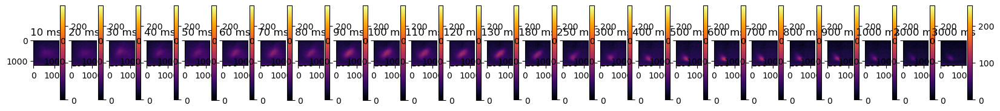

In [7]:
# Now plot out all of the images from above

plt.figure(figsize=(20, 12))
for i, (key, value) in enumerate(redMOT_dict.items()):
    plt.subplot(1, len(redMOT_dict), i+1)
    plt.imshow(value, cmap='inferno', vmin=0, vmax=255)
    plt.title(key)
    plt.colorbar()

    

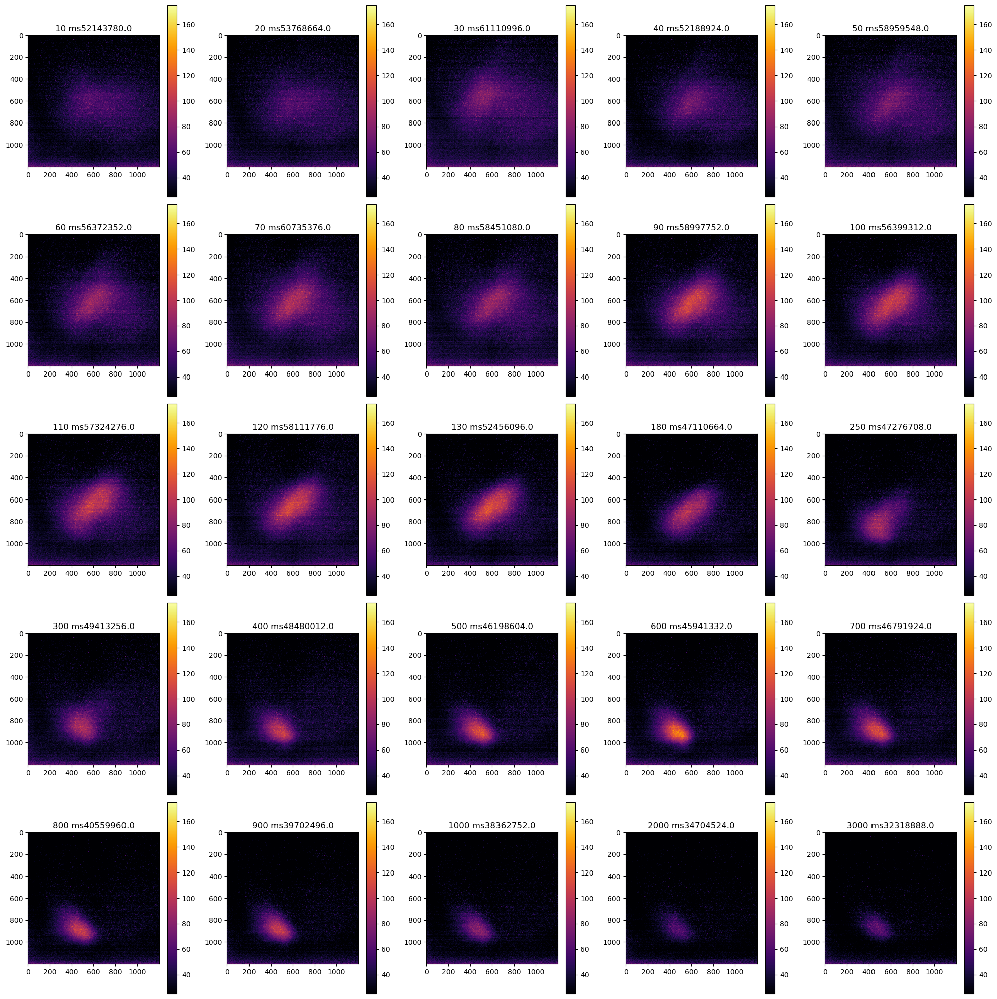

In [19]:
# Plot all red MOT images in a 5x5 grid
plt.figure(figsize=(20,20))
for i, (key, value) in enumerate(redMOT_dict.items()):
    plt.subplot(5, 5, i + 1)
    plt.imshow(value, cmap='inferno', vmin=25, vmax=175)
    plt.title(key+""+str(np.sum(value)))
    plt.colorbar()
plt.tight_layout()
plt.show()

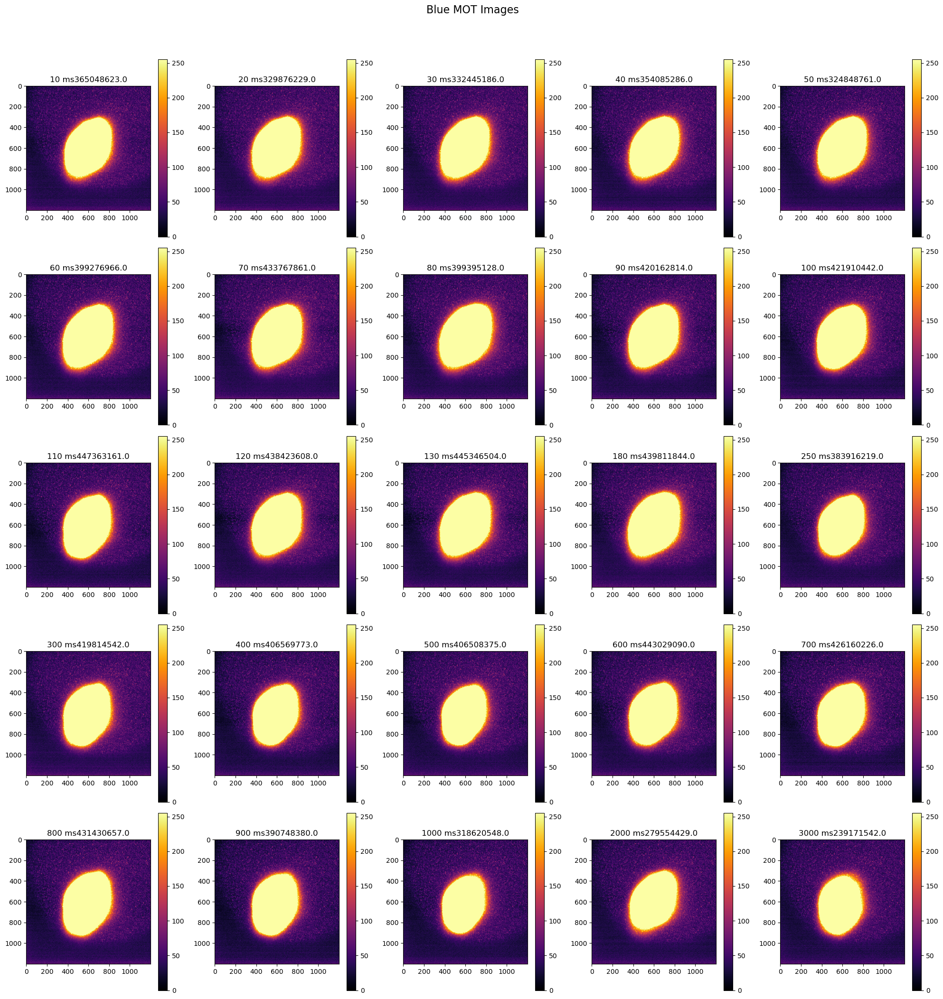

In [13]:
# Plot all blue MOT images in a 5x5 grid
plt.figure(figsize=(20,20))
for i, (key, value) in enumerate(blueMOT_dict.items()):
    plt.subplot(5, 5, i + 1)
    plt.imshow(value, cmap='inferno', vmin=0, vmax=255)
    plt.title(key+""+str(np.sum(value)))
    plt.colorbar()
plt.tight_layout()
plt.suptitle('Blue MOT Images', fontsize=16, y=1.05)
plt.show()

In [42]:
bbmod_duration = []
redMOT_pixel_sum = []
blueMOT_pixel_sum = []

for (keys,values) in redMOT_dict.items():
    # print(keys.split(' ')[0])
    # print(np.sum(values))

    bbmod_duration.append(int(keys.split(' ')[0]))
    redMOT_pixel_sum.append(np.sum(values))

for (keys,values) in blueMOT_dict.items():
    blueMOT_pixel_sum.append(np.sum(values))


In [44]:
np.argmax(blueMOT_pixel_sum)

10

In [48]:
blueMOT_normalisation_scaling_factor = [i/np.max(blueMOT_pixel_sum) for i in blueMOT_pixel_sum]
blueMOT_normalisation_scaling_factor

[0.8160006339905131,
 0.7373790641648296,
 0.7431215061536995,
 0.791494063142137,
 0.7261410623839901,
 0.8925119473572389,
 0.9696101485656303,
 0.8927760772863459,
 0.9391985094633217,
 0.943105017983365,
 1.0,
 0.9800172348120546,
 0.9954921254680602,
 0.9831203870628945,
 0.8581757562286181,
 0.9384200099569665,
 0.9088137076177356,
 0.9086764634158153,
 0.990311962678572,
 0.9526046468542366,
 0.9643857487854258,
 0.8734478250881279,
 0.7122190108094305,
 0.6248937180591855,
 0.5346250269364491]

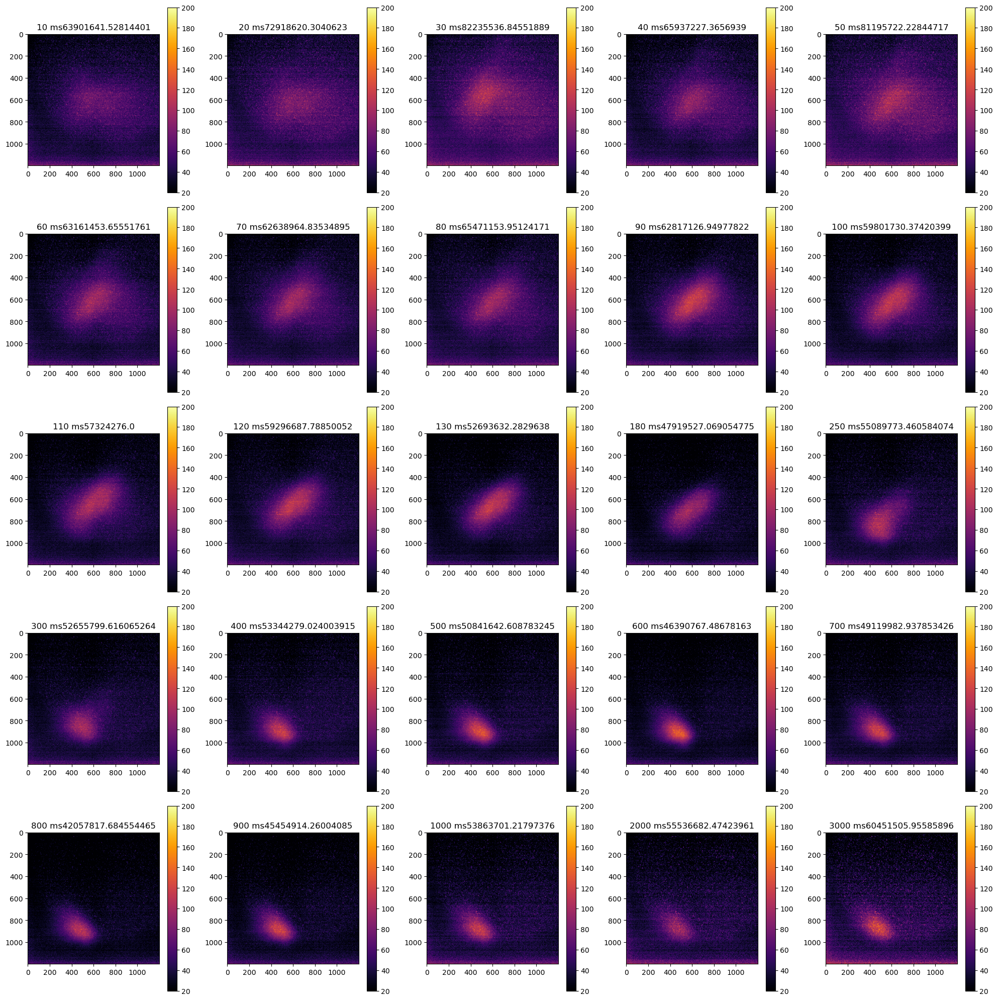

In [52]:
# Plot all red MOT images in a 5x5 grid
plt.figure(figsize=(20,20))
for i, (key, value) in enumerate(redMOT_dict.items()):
    normalised_value = value / blueMOT_normalisation_scaling_factor[i]
    plt.subplot(5, 5, i + 1)
    plt.imshow(normalised_value, cmap='inferno', vmin=20, vmax=200)
    plt.title(key+""+str(np.sum(normalised_value)))
    plt.colorbar()
plt.tight_layout()
plt.show()

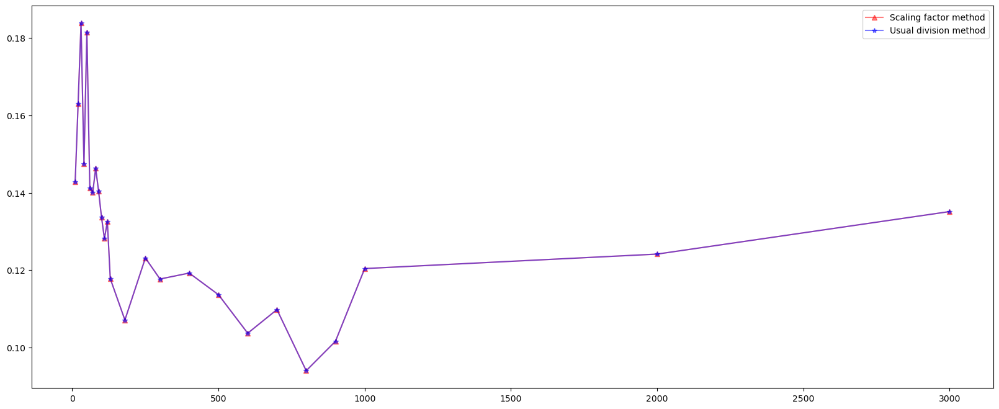

In [ ]:
# Checking this method agrees with the usual transfer efficiency method of dividing the redMOT by the blueMOT - it does! yay :D

plt.figure(figsize=(20,8))

normalised_transfer_efficiency=[]

for i in range(len(redMOT_pixel_sum)):
    normalised_redMOT_value = redMOT_pixel_sum[i] / blueMOT_normalisation_scaling_factor[i]
    normalised_transfer_efficiency.append(normalised_redMOT_value/blueMOT_pixel_sum[10])

plt.plot(bbmod_duration,normalised_transfer_efficiency,'r^-',alpha=0.5,label='Scaling factor method')
plt.plot(bbmod_duration,[red/blue for red,blue in zip(redMOT_pixel_sum,blueMOT_pixel_sum)],'b*-',alpha=0.5,label='Usual division method')
plt.legend()

# 250427 Now plotting with nice LaTex Font of red MOT above

In [63]:
# copy paste this code to the beginning of your script to set the plotting style for a two column figure

from matplotlib import pyplot as plt

plt.rcParams.update({
    "text.usetex": True,
    "font.family": "serif",
    "font.serif": ["Computer Modern Roman"],
    # "figure.constrained_layout.use": True
})

plt.rcParams["figure.autolayout"] = False # set to True if you want to use constrained_layout

plt.rcParams["savefig.bbox"] = None
plt.rcParams["figure.figsize"] = (5.9,6)
plt.rcParams["figure.titlesize"] = 10 # this is only for plt.suptitle, i set it to be the same as the rest

plt.rcParams["axes.titlesize"] = 10 # control title size
plt.rcParams["axes.labelsize"] = 10 # control x and y axis labels
plt.rcParams["axes.labelpad"] = 4.0 # distance between axis label and axis numbers
plt.rcParams["xtick.labelsize"] = 10 # independent control of xlabel fontsize
plt.rcParams["ytick.labelsize"] = 10 # independent control of ylabel fontsize

plt.rcParams["legend.fontsize"] = 7.5 # control legend size, I set it to be slightly smaller than title/axes label
# plt.rcParams["legend.facecolor"] = (0.9, 0.9, 0.9) # legend background color
# plt.rcParams["legend.edgecolor"] = (0, 0, 0) # legend border line color
# plt.rcParams["legend.frameon"] = True # whether or not to draw a border around legend
# plt.rcParams["legend.framealpha"] = 0.1 # legend background transparency
plt.rcParams["legend.loc"] = "upper left" # default legend location
plt.rcParams["legend.handletextpad"] = 0.8  # Horizontal space between legend point and text (default 0.8)
plt.rcParams["legend.labelspacing"] = 0.6  # Vertical space between legend entries (default 0.5)
# plt.rcParams["legend.columnspacing"] = 2.0  # Space between columns in multi-column legends
# plt.rcParams["legend.borderpad"] = 1.0  # Space between legend content and the box
# plt.rcParams["legend.handlelength"] = 2.0  # Length of legend marker lines

plt.rcParams["lines.linewidth"] = 1
# plt.rcParams["lines.markeredgewidth"] = 0.7
plt.rcParams["lines.markersize"] = 4 #data point size

plt.rcParams["grid.linestyle"] = "--"
plt.rcParams['axes.grid'] = False
# plt.rcParams["grid.linewidth"] = 0.7

# plt.rcParams["xtick.major.pad"] = 4.0 # distance between xticks dashes and xaxis numbers
# plt.rcParams["xtick.major.size"] = 3.0
# plt.rcParams["xtick.major.width"] = 0.7
plt.rcParams["ytick.major.pad"] = 4.0 # distance between yticks dashes and yaxis numbers
# plt.rcParams["ytick.major.size"] = 3.0
# plt.rcParams["ytick.major.width"] = 0.7

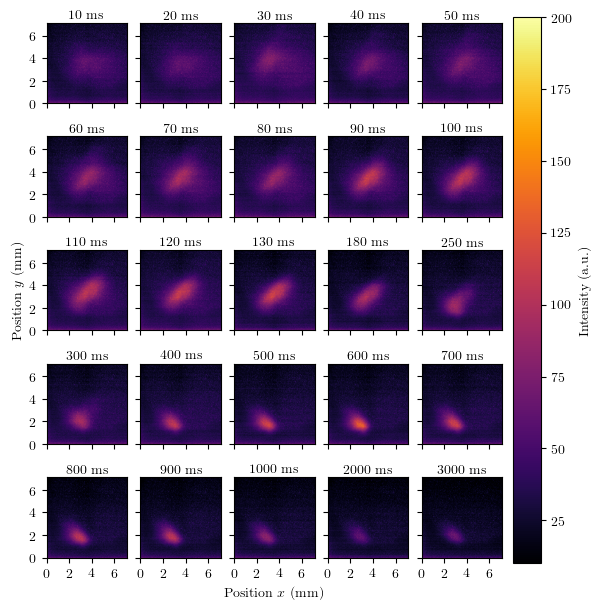

In [ ]:
# plot six figures in a 5-row, 5-column layout
fig, axes = plt.subplots(5, 5, sharex=True, sharey=True, constrained_layout=True)

pixel_size_um = (1/0.58)*3.45/1000  # how many mm per pixel

extent = [0, redMOT_dict["10 ms"].shape[1]*pixel_size_um,  # x-axis: 0 to 1200 * 5
          0, redMOT_dict["10 ms"].shape[0]*pixel_size_um]  # y-axis: 0 to 1200 * 5

for i, (key, value) in enumerate(redMOT_dict.items()):
    ax = axes[i//5, i%5]  # Get the current axis
    im = ax.imshow(value, cmap='inferno', vmin=10, vmax=200, extent=extent)
    ax.set_title(key,pad=3)
    ax.set_yticks([0, 2, 4, 6])
    ax.set_yticklabels([0, 2, 4, 6])
    ax.set_xticks([0, 2, 4, 6])
    ax.set_xticklabels([0, 2, 4, 6])

axes[2, 0].set_ylabel(r"Position $y$ (mm)")
axes[4,2].set_xlabel(r"Position $x$ (mm)")

# Add a colorbar to the last subplot
cbar = fig.colorbar(im, ax=axes, shrink=0.985, pad=0.025)
cbar.set_label(r"Intensity (a.u.)")

# plt.savefig("250427 BBRedMOTModulationDurationFluorescenceImages.pdf", dpi=300)

# Errata: the current red MOT images are absolute fluorescence. We should change it such that it has they all "start" with the same amount of blue MOT (obviously this is not possibel experimentally) - so we implement a scale factor

In [ ]:
bbmod_duration = []
redMOT_pixel_sum = []
blueMOT_pixel_sum = []

for (keys,values) in redMOT_dict.items():
    # print(keys.split(' ')[0])
    # print(np.sum(values))

    bbmod_duration.append(int(keys.split(' ')[0]))
    redMOT_pixel_sum.append(np.sum(values))

for (keys,values) in blueMOT_dict.items():
    blueMOT_pixel_sum.append(np.sum(values))


In [61]:
redMOT_fluorescence_scaling_factor_normalisation_wrt_brightest_blueMOT = [i/np.max(blueMOT_pixel_sum) for i in blueMOT_pixel_sum] 
# ^ scale all red MOT fluorescence images by taking the brightest blue MOT fluorescence image as normalisation = 1, and all other blue MOT images are relative to that
# ^ this therefore gives us the scaling factor to scale all the red MOT images by,
# ^ such that all the red MOT fluorescnce images are as if they started with the brightest blue MOT (benchmark as 1)
redMOT_fluorescence_scaling_factor_normalisation_wrt_brightest_blueMOT

[0.8160006339905131,
 0.7373790641648296,
 0.7431215061536995,
 0.791494063142137,
 0.7261410623839901,
 0.8925119473572389,
 0.9696101485656303,
 0.8927760772863459,
 0.9391985094633217,
 0.943105017983365,
 1.0,
 0.9800172348120546,
 0.9954921254680602,
 0.9831203870628945,
 0.8581757562286181,
 0.9384200099569665,
 0.9088137076177356,
 0.9086764634158153,
 0.990311962678572,
 0.9526046468542366,
 0.9643857487854258,
 0.8734478250881279,
 0.7122190108094305,
 0.6248937180591855,
 0.5346250269364491]

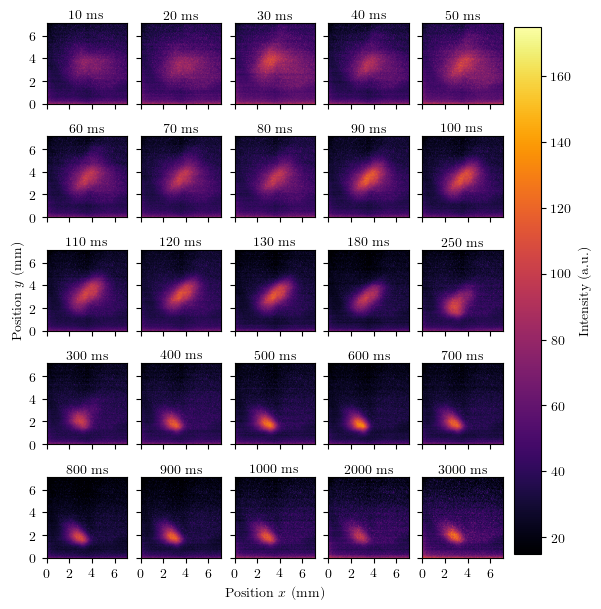

In [68]:
# Now with the new scaling factor, we can plot the red MOT images again

# plot six figures in a 5-row, 5-column layout
fig, axes = plt.subplots(5, 5, sharex=True, sharey=True, constrained_layout=True)

pixel_size_um = (1/0.58)*3.45/1000  # how many mm per pixel

extent = [0, redMOT_dict["10 ms"].shape[1]*pixel_size_um,  # x-axis: 0 to 1200 * 5
          0, redMOT_dict["10 ms"].shape[0]*pixel_size_um]  # y-axis: 0 to 1200 * 5

for i, (key, value) in enumerate(redMOT_dict.items()):
    ax = axes[i//5, i%5]  # Get the current axis
    normalised_scaled_redMOT_value = value / redMOT_fluorescence_scaling_factor_normalisation_wrt_brightest_blueMOT[i]
    im = ax.imshow(normalised_scaled_redMOT_value, cmap='inferno', vmin=15, vmax=175, extent=extent)
    ax.set_title(key,pad=3)
    ax.set_yticks([0, 2, 4, 6])
    ax.set_yticklabels([0, 2, 4, 6])
    ax.set_xticks([0, 2, 4, 6])
    ax.set_xticklabels([0, 2, 4, 6])

axes[2, 0].set_ylabel(r"Position $y$ (mm)")
axes[4,2].set_xlabel(r"Position $x$ (mm)")

# Add a colorbar to the last subplot
cbar = fig.colorbar(im, ax=axes, shrink=0.950, pad=0.025)
cbar.set_label(r"Intensity (a.u.)")

plt.savefig("250427 BBRedMOTModulationDurationFluorescenceImages.pdf", dpi=300)

# 250427 Plot transfer efficiency as a function of modulation duration (normalise against blue MOT fluorescence)

In [69]:
redMOT_dict.keys();

In [70]:
redMOT_dict.items();

In [71]:
redMOT_dict.values();

In [72]:
for (keys,values) in redMOT_dict.items():
    print(keys,np.min(values),np.max(values),np.sum(values))

10 ms 0.0 220.0 52143780.0
20 ms 0.0 220.0 53768664.0
30 ms 0.0 248.0 61110996.0
40 ms 0.0 220.0 52188924.0
50 ms 0.0 228.0 58959548.0
60 ms 0.0 256.0 56372352.0
70 ms 0.0 252.0 60735376.0
80 ms 0.0 236.0 58451080.0
90 ms 0.0 236.0 58997752.0
100 ms 0.0 232.0 56399312.0
110 ms 0.0 232.0 57324276.0
120 ms 0.0 232.0 58111776.0
130 ms 0.0 248.0 52456096.0
180 ms 0.0 228.0 47110664.0
250 ms 0.0 220.0 47276708.0
300 ms 0.0 236.0 49413256.0
400 ms 0.0 240.0 48480012.0
500 ms 0.0 220.0 46198604.0
600 ms 0.0 228.0 45941332.0
700 ms 0.0 236.0 46791924.0
800 ms 0.0 224.0 40559960.0
900 ms 0.0 236.0 39702496.0
1000 ms 0.0 228.0 38362752.0
2000 ms 0.0 228.0 34704524.0
3000 ms 0.0 216.0 32318888.0


In [73]:
bbmod_duration = []
redMOT_pixel_sum = []
blueMOT_pixel_sum = []

for (keys,values) in redMOT_dict.items():
    # print(keys.split(' ')[0])
    # print(np.sum(values))

    bbmod_duration.append(int(keys.split(' ')[0]))
    redMOT_pixel_sum.append(np.sum(values))

for (keys,values) in blueMOT_dict.items():
    blueMOT_pixel_sum.append(np.sum(values))

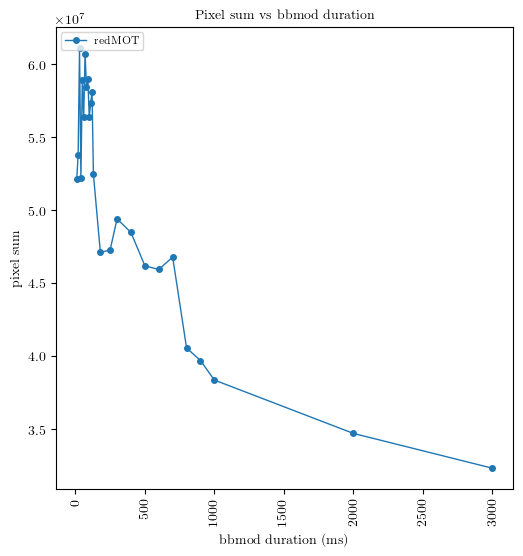

In [74]:
plt.plot(bbmod_duration, redMOT_pixel_sum, 'o-', label='redMOT')
plt.xlabel('bbmod duration (ms)')
plt.ylabel('pixel sum')
plt.title('Pixel sum vs bbmod duration')
plt.xticks(rotation=90)
plt.legend()
plt.show()

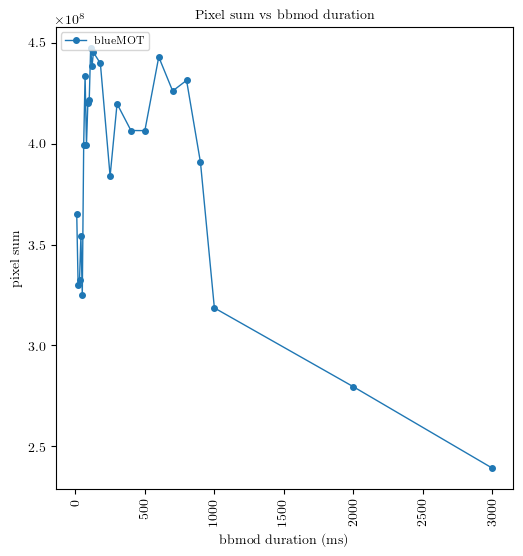

In [75]:
plt.plot(bbmod_duration, blueMOT_pixel_sum, 'o-', label='blueMOT')
plt.xlabel('bbmod duration (ms)')
plt.ylabel('pixel sum')
plt.title('Pixel sum vs bbmod duration')
plt.xticks(rotation=90)
plt.legend()
plt.show()

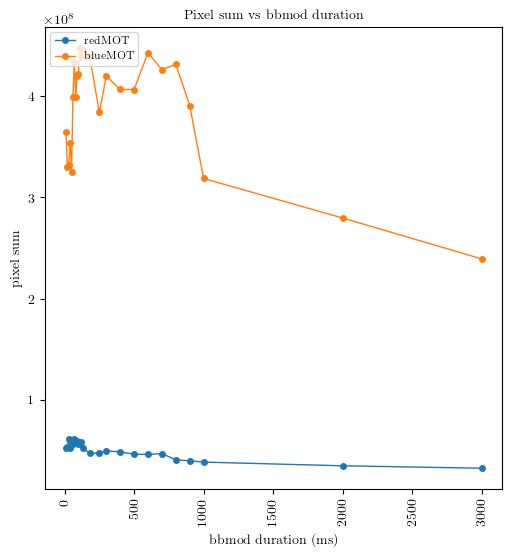

In [76]:
plt.plot(bbmod_duration, redMOT_pixel_sum, 'o-', label='redMOT')
plt.plot(bbmod_duration, blueMOT_pixel_sum, 'o-', label='blueMOT')
plt.xlabel('bbmod duration (ms)')
plt.ylabel('pixel sum')
plt.title('Pixel sum vs bbmod duration')
plt.xticks(rotation=90)
plt.legend()
plt.show()

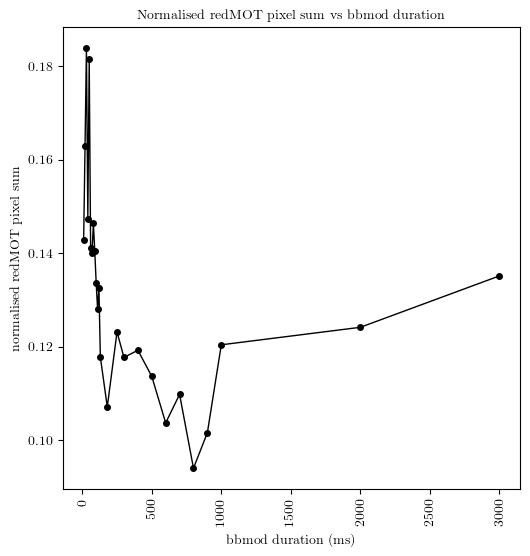

In [77]:
normalised_redMOT_pixel_sum_wrt_blueMOT = [i / j for i, j in zip(redMOT_pixel_sum, blueMOT_pixel_sum)]

plt.plot(bbmod_duration, normalised_redMOT_pixel_sum_wrt_blueMOT, 'ko-')
plt.xlabel('bbmod duration (ms)')
plt.ylabel('normalised redMOT pixel sum')
plt.title('Normalised redMOT pixel sum vs bbmod duration')
plt.xticks(rotation=90)
plt.show()

# 250427 Plot above but in nice LaTex Font

In [129]:
# copy paste this code to the beginning of your script to set the plotting style for a one column figure

from matplotlib import pyplot as plt

plt.rcParams.update({
    "text.usetex": True,
    "font.family": "serif",
    "font.serif": ["Computer Modern Roman"],
    "figure.constrained_layout.use": True
})

plt.rcParams["savefig.bbox"] = None
plt.rcParams["figure.figsize"] = (5.9,3)  # (width, height) in inches, change height but not width
plt.rcParams["figure.titlesize"] = 10 # this is only for plt.suptitle, i set it to be the same as the rest

plt.rcParams["axes.titlesize"] = 10 # control title size
plt.rcParams["axes.labelsize"] = 10 # control x and y axis labels
plt.rcParams["axes.labelpad"] = 4.0 # distance between axis label and axis numbers
plt.rcParams["xtick.labelsize"] = 10 # independent control of xlabel fontsize
plt.rcParams["ytick.labelsize"] = 10 # independent control of ylabel fontsize

plt.rcParams["legend.fontsize"] = 7.5 # control legend size, I set it to be slightly smaller than title/axes label
# plt.rcParams["legend.facecolor"] = (0.9, 0.9, 0.9) # legend background color
# plt.rcParams["legend.edgecolor"] = (0, 0, 0) # legend border line color
# plt.rcParams["legend.frameon"] = True # whether or not to draw a border around legend
# plt.rcParams["legend.framealpha"] = 0.1 # legend background transparency
plt.rcParams["legend.loc"] = "best" # default legend location
plt.rcParams["legend.handletextpad"] = 0.8  # Horizontal space between legend point and text (default 0.8)
plt.rcParams["legend.labelspacing"] = 0.6  # Vertical space between legend entries (default 0.5)
# plt.rcParams["legend.columnspacing"] = 2.0  # Space between columns in multi-column legends
# plt.rcParams["legend.borderpad"] = 1.0  # Space between legend content and the box
# plt.rcParams["legend.handlelength"] = 2.0  # Length of legend marker lines


# CHOOSE NICE COLOR FOR DARK MARKER EDGEWIDTH FROM "dodgerblue","mediumseagreen","indianred","mediumpurple","slateblue","darkorange","peru","goldenrod"
plt.rcParams["lines.linewidth"] = 1
plt.rcParams["lines.markersize"] = 6 #data point size
plt.rcParams["lines.markeredgewidth"] = 1.5 # width of the edge of the marker
plt.rcParams["lines.markeredgecolor"] = "black" # color of the edge of the marker
plt.rcParams["lines.markerfacecolor"] = "crimson" # color of the inside of the marker
plt.rcParams["lines.marker"] = "o" # marker type, see https://matplotlib.org/stable/api/markers_api.html for all options
plt.rcParams["lines.color"] = "black" # color of the line
# # CHOOSE NICE COLOR FOR DARK MARKER EDGEWIDTH FROM "dodgerblue","mediumseagreen","crimson","mediumpurple","slateblue","darkorange","peru","goldenrod"


plt.rcParams["grid.linestyle"] = "--"
plt.rcParams['axes.grid'] = True
# plt.rcParams["grid.linewidth"] = 0.7

# plt.rcParams["xtick.major.pad"] = 4.0 # distance between xticks dashes and xaxis numbers
# plt.rcParams["xtick.major.size"] = 3.0
# plt.rcParams["xtick.major.width"] = 0.7
# plt.rcParams["ytick.major.pad"] = 4.0 # distance between yticks dashes and yaxis numbers
# plt.rcParams["ytick.major.size"] = 3.0
# plt.rcParams["ytick.major.width"] = 0.7

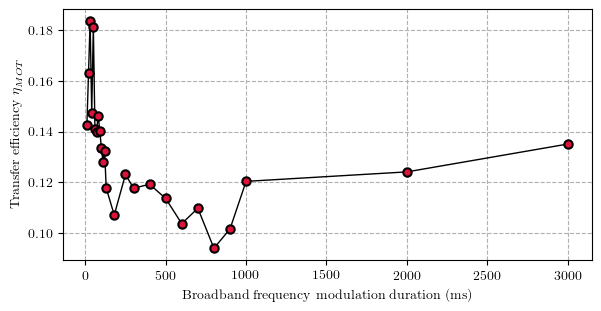

In [130]:
bbmod_duration = []
redMOT_pixel_sum = []
blueMOT_pixel_sum = []

for (keys,values) in redMOT_dict.items():
    # print(keys.split(' ')[0])
    # print(np.sum(values))

    bbmod_duration.append(int(keys.split(' ')[0]))
    redMOT_pixel_sum.append(np.sum(values))

for (keys,values) in blueMOT_dict.items():
    blueMOT_pixel_sum.append(np.sum(values))

normalised_redMOT_pixel_sum_wrt_blueMOT = [i / j for i, j in zip(redMOT_pixel_sum, blueMOT_pixel_sum)]

plt.plot(bbmod_duration, normalised_redMOT_pixel_sum_wrt_blueMOT, 'ko-')
plt.xlabel('Broadband frequency modulation duration (ms)')
plt.ylabel(r'Transfer efficiency $\eta_{MOT}$')
plt.show()

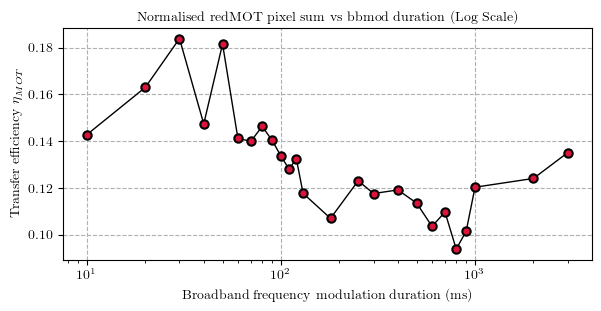

In [131]:
plt.plot(bbmod_duration, normalised_redMOT_pixel_sum_wrt_blueMOT, 'ko-')
plt.xscale('log')  # Set x-axis to logarithmic scale
plt.xlabel('Broadband frequency modulation duration (ms)')
plt.ylabel(r'Transfer efficiency $\eta_{MOT}$')
plt.title('Normalised redMOT pixel sum vs bbmod duration (Log Scale)')
plt.show()

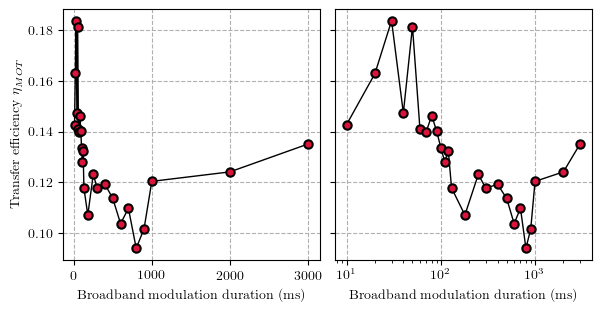

In [132]:
fig, ax = plt.subplots(1,2,sharey=True)
ax[0].plot(bbmod_duration, normalised_redMOT_pixel_sum_wrt_blueMOT, 'ko-')
ax[0].set_xlabel('Broadband modulation duration (ms)')
ax[0].set_ylabel(r'Transfer efficiency $\eta_{MOT}$')

ax[1].plot(bbmod_duration, normalised_redMOT_pixel_sum_wrt_blueMOT, 'ko-')
ax[1].set_xscale('log')  # Set x-axis to logarithmic scale
ax[1].set_xlabel('Broadband modulation duration (ms)')
# ax[1].set_ylabel(r'Transfer efficiency $\eta_{MOT}$')

plt.savefig("250427 BBRedMOTModulationDurationTransferEfficiency.pdf", dpi=300)